In [1]:
import pandas as pd 
import seaborn as sns
import matplotlib.pyplot as plt
import umap
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
from sklearn.preprocessing import StandardScaler
import umap
from scipy import stats
import numpy as np

In [2]:
df = pd.read_csv('https://raw.githubusercontent.com/luminarian/Thinkful-Capstone-3/97f2df7261a9d688911a4b724a289f22a9ee3138/data.csv', encoding= 'unicode_escape')
df.head()

,InvoiceNo,StockCode,Description,Quantity,InvoiceDate,UnitPrice,CustomerID,Country
0,536365,85123A,WHITE HANGING HEART T-LIGHT HOLDER,6,12/1/2010 8:26,2.55,17850.0,United Kingdom
1,536365,71053,WHITE METAL LANTERN,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
2,536365,84406B,CREAM CUPID HEARTS COAT HANGER,8,12/1/2010 8:26,2.75,17850.0,United Kingdom
3,536365,84029G,KNITTED UNION FLAG HOT WATER BOTTLE,6,12/1/2010 8:26,3.39,17850.0,United Kingdom
4,536365,84029E,RED WOOLLY HOTTIE WHITE HEART.,6,12/1/2010 8:26,3.39,17850.0,United Kingdom


In [3]:
df.describe(include='O')

,InvoiceNo,StockCode,Description,InvoiceDate,Country
count,541909,541909,540455,541909,541909
unique,25900,4070,4223,23260,38
top,573585,85123A,WHITE HANGING HEART T-LIGHT HOLDER,10/31/2011 14:41,United Kingdom
freq,1114,2313,2369,1114,495478


In [4]:
df.describe()

,Quantity,UnitPrice,CustomerID
count,541909.000000,541909.000000,406829.000000
mean,9.552250,4.611114,15287.690570
std,218.081158,96.759853,1713.600303
min,-80995.000000,-11062.060000,12346.000000
25%,1.000000,1.250000,13953.000000
50%,3.000000,2.080000,15152.000000
75%,10.000000,4.130000,16791.000000
max,80995.000000,38970.000000,18287.000000


In [5]:
countryCodes = pd.get_dummies(df['Country'])
df = pd.concat([df, countryCodes], axis=1)
df = df.drop('Country', axis=1)

In [6]:
subsample = df.sample(n=30000)

In [7]:
transactions = subsample.groupby(['InvoiceNo']).mean()
transactions['Payment'] = transactions['Quantity'] * transactions['UnitPrice']
transactions.describe()

,Quantity,UnitPrice,CustomerID,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
count,11685.000000,11685.000000,10634.000000,11685.000000,11685.000000,11685.000000,11685.000000,11685.000000,11685.000000,11685.00000,...,11685.000000,11685.000000,11685.000000,11685.000000,11685.000000,11685.000000,11685.000000,11685.000000,11685.000000,11685.000000
mean,18.490296,4.176775,15266.600244,0.002653,0.000856,0.000086,0.006162,0.000086,0.000171,0.00154,...,0.000086,0.000257,0.005306,0.001198,0.002910,0.000428,0.000171,0.896106,0.000770,32.791520
std,694.805281,51.010663,1724.168090,0.051441,0.029243,0.009251,0.078258,0.009251,0.013082,0.03922,...,0.009251,0.016022,0.072652,0.034595,0.053866,0.020682,0.013082,0.305136,0.027743,720.304081
min,-9600.000000,0.000000,12346.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,-5225.030000
25%,2.000000,1.326667,13813.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,6.416667
50%,6.000000,2.216667,15154.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,15.000000
75%,12.000000,4.080000,16779.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,25.000000
max,74215.000000,5225.030000,18287.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.00000,...,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,77183.600000


In [8]:
clean_transactions = transactions.copy()
clean_transactions['Quantity'] = clean_transactions['Quantity'][clean_transactions['Quantity'].between(clean_transactions['Quantity'].quantile(.05), clean_transactions['Quantity'].quantile(.95))]
clean_transactions['UnitPrice'] = clean_transactions['UnitPrice'][clean_transactions['UnitPrice'].between(clean_transactions['UnitPrice'].quantile(.05), clean_transactions['UnitPrice'].quantile(.95))]
clean_transactions['Payment'] = clean_transactions['Payment'][clean_transactions['Payment'].between(clean_transactions['Payment'].quantile(.05), clean_transactions['Payment'].quantile(.95))]
clean_transactions = clean_transactions.dropna(axis=0)
clean_transactions = clean_transactions.drop('CustomerID', axis=1)
clean_transactions.describe()


,Quantity,UnitPrice,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,Cyprus,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
count,9011.000000,9011.000000,9011.000000,9011.000000,9011.0,9011.000000,9011.000000,9011.000000,9011.000000,9011.000000,...,9011.0,9011.000000,9011.000000,9011.000000,9011.000000,9011.000000,9011.000000,9011.000000,9011.000000,9011.000000
mean,9.049793,2.663708,0.001998,0.000888,0.0,0.006548,0.000111,0.000111,0.001776,0.001110,...,0.0,0.000222,0.005882,0.000777,0.002996,0.000222,0.000222,0.899345,0.000555,18.462539
std,8.218035,1.817123,0.044652,0.029784,0.0,0.080656,0.010534,0.010534,0.042103,0.033296,...,0.0,0.014897,0.076471,0.027862,0.054660,0.014897,0.014897,0.300888,0.023551,15.598149
min,1.000000,0.420000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.420000
25%,3.000000,1.316667,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,7.500000
50%,6.833333,2.090000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,15.200000
75%,12.000000,3.518750,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,23.200000
max,48.000000,8.500000,1.000000,1.000000,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,...,0.0,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,90.577778


Dropping any rows with null values and clear outliers (5th quantile on low and high side)

In [9]:
scaler = StandardScaler()
scaled_transactions = scaler.fit_transform(clean_transactions)

Scaling data for PCA analysis

In [10]:
pca = PCA(n_components=2)
stock_pca = pca.fit_transform(scaled_transactions)

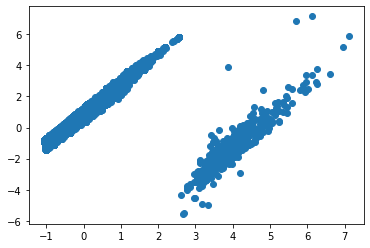

In [11]:
plt.scatter(x=stock_pca[:, 0], y=stock_pca[:, 1])
plt.show()

Looks to be two clusters on the PCA analysis

[t-SNE] Computing 451 nearest neighbors...
[t-SNE] Indexed 9011 samples in 0.181s...
[t-SNE] Computed neighbors for 9011 samples in 1.944s...
[t-SNE] Computed conditional probabilities for sample 1000 / 9011
[t-SNE] Computed conditional probabilities for sample 2000 / 9011
[t-SNE] Computed conditional probabilities for sample 3000 / 9011
[t-SNE] Computed conditional probabilities for sample 4000 / 9011
[t-SNE] Computed conditional probabilities for sample 5000 / 9011
[t-SNE] Computed conditional probabilities for sample 6000 / 9011
[t-SNE] Computed conditional probabilities for sample 7000 / 9011
[t-SNE] Computed conditional probabilities for sample 8000 / 9011
[t-SNE] Computed conditional probabilities for sample 9000 / 9011
[t-SNE] Computed conditional probabilities for sample 9011 / 9011
[t-SNE] Mean sigma: 0.000000
[t-SNE] KL divergence after 250 iterations with early exaggeration: 57.724674
[t-SNE] KL divergence after 300 iterations: 1.077932


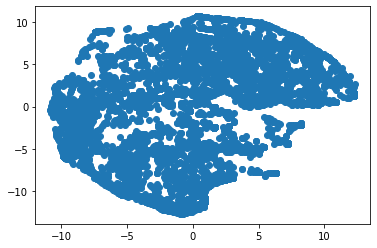

In [12]:
tsne = TSNE(n_components=2, verbose=1, perplexity=150, n_iter=300)
stock_tsne = tsne.fit_transform(clean_transactions)
plt.scatter(x=stock_tsne[:, 0], y=stock_tsne[:, 1])
plt.show()

Looks to be two large lumps dividing transaction types using the unscaled data, so attempting to find clustering on the tsne analysis may be difficult

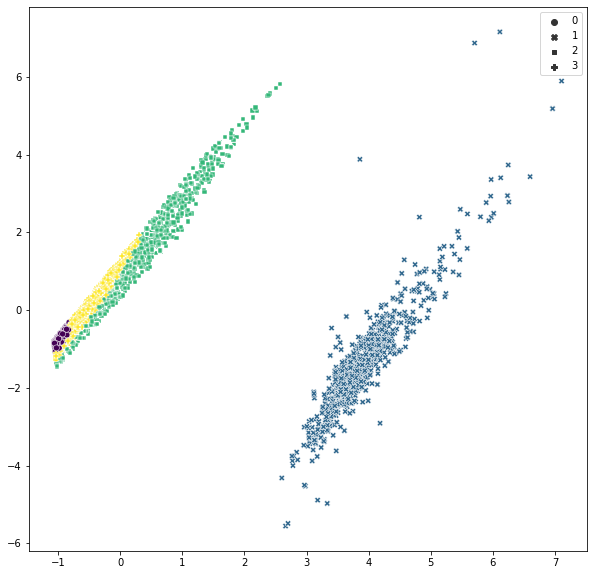

In [15]:
#GMM Clustering
from sklearn.mixture import GaussianMixture

pca_gmm_cluster = GaussianMixture(n_components=4)
clusters = pca_gmm_cluster.fit_predict(stock_pca)

plt.figure(figsize=(10, 10))

sns.scatterplot(x=stock_pca[:, 0], y=stock_pca[:, 1], c=clusters, style=clusters)

plt.show()

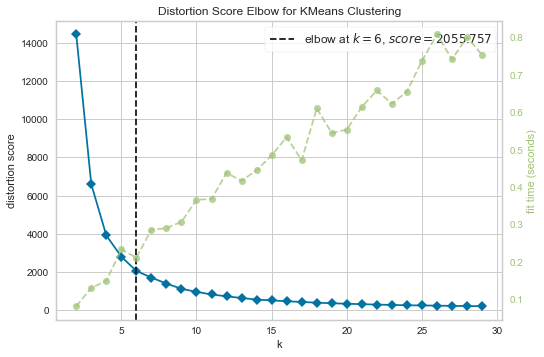

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [16]:
# Elbow Method for K means
# Import ElbowVisualizer
from sklearn.cluster import KMeans
import yellowbrick
from yellowbrick.cluster import KElbowVisualizer
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(stock_pca)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

Elbow score for KMeans indicates the number of clusters should be 6. See below for clustering visualization of this model

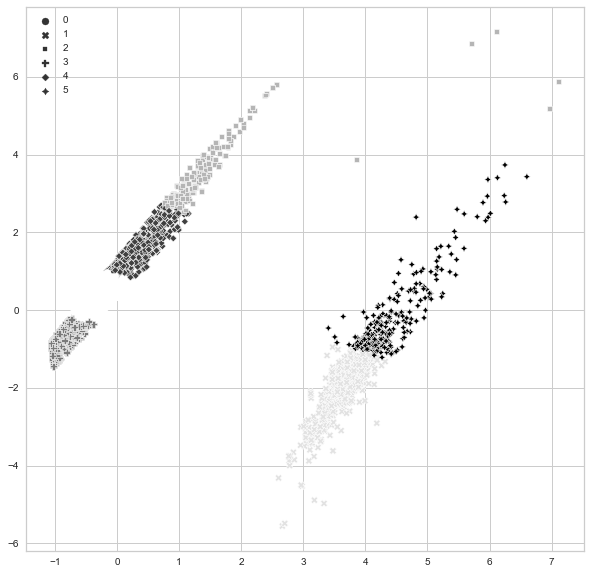

In [23]:
#KMeans Clustering
pca_kmeans_cluster = KMeans(n_clusters=6)
clusters = pca_kmeans_cluster.fit_predict(stock_pca)

plt.figure(figsize=(10, 10))

sns.scatterplot(x=stock_pca[:, 0], y=stock_pca[:, 1], c=clusters, style=clusters)

plt.show()

Now performing analysis on a separate sample

In [25]:
subsample2 = df.sample(n=30000)


In [27]:
transactions2 = subsample2.groupby(['InvoiceNo']).mean()
transactions2['Payment'] = transactions2['Quantity'] * transactions2['UnitPrice']
transactions2

,Quantity,UnitPrice,CustomerID,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
InvoiceNo,,,,,,,,,,,,,,,,,,,,,
536368,3.000000,4.950000,13047.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,14.850000
536370,34.000000,0.850000,12583.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,28.900000
536373,4.000000,5.996667,17850.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,23.986667
536375,6.000000,2.225000,17850.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,13.350000
536381,1.000000,4.950000,15311.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,4.950000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
C580968,-5.666667,10.133333,15622.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,-57.422222
C581162,-3.000000,1.060000,14739.0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,-3.180000
C581229,-11.000000,1.250000,12558.0,0,0,0,0,0,0,0,...,0,0,0,0,0,1,0,0,0,-13.750000


In [28]:
clean_transactions2 = transactions2.copy()
clean_transactions2['Quantity'] = clean_transactions2['Quantity'][clean_transactions2['Quantity'].between(clean_transactions2['Quantity'].quantile(.05), clean_transactions2['Quantity'].quantile(.95))]
clean_transactions2['UnitPrice'] = clean_transactions2['UnitPrice'][clean_transactions2['UnitPrice'].between(clean_transactions2['UnitPrice'].quantile(.05), clean_transactions2['UnitPrice'].quantile(.95))]
clean_transactions2['Payment'] = clean_transactions2['Payment'][clean_transactions2['Payment'].between(clean_transactions2['Payment'].quantile(.05), clean_transactions2['Payment'].quantile(.95))]
clean_transactions2 = clean_transactions2.dropna(axis=0)
clean_transactions2 = clean_transactions2.drop('CustomerID', axis=1)
clean_transactions2

,Quantity,UnitPrice,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,Cyprus,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
InvoiceNo,,,,,,,,,,,,,,,,,,,,,
536368,3.0,4.950000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,14.850000
536370,34.0,0.850000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,28.900000
536373,4.0,5.996667,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,23.986667
536375,6.0,2.225000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,13.350000
536381,1.0,4.950000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,4.950000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
581567,3.0,5.950000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,17.850000
581571,1.0,6.250000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,1,0,6.250000
581578,12.0,3.445000,0,0,0,0,0,0,0,0,...,0,0,0,0,0,0,0,0,0,41.340000


In [29]:
scaled_transactions2 = scaler.transform(clean_transactions)

In [30]:
stock_pca2 = pca.transform(scaled_transactions2)

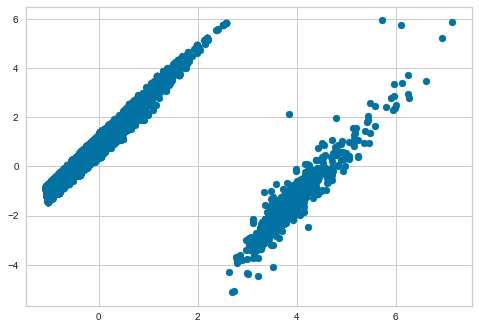

In [31]:
plt.scatter(x=stock_pca2[:, 0], y=stock_pca2[:, 1])
plt.show()

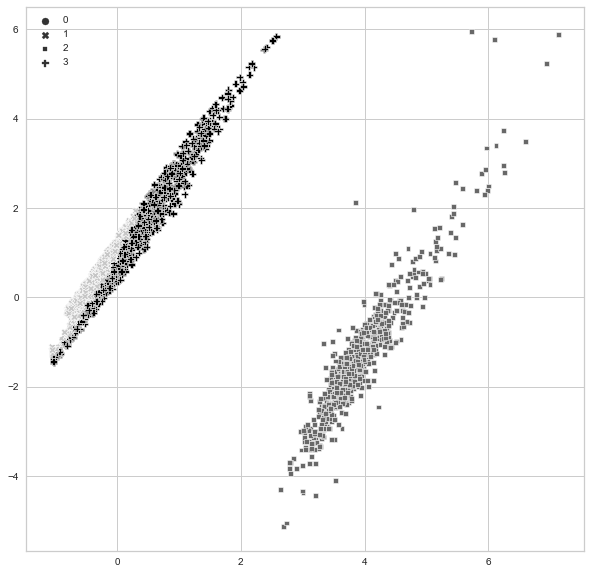

In [32]:
from sklearn.mixture import GaussianMixture

tsne_gmm_cluster = GaussianMixture(n_components=4)
clusters2 = tsne_gmm_cluster.fit_predict(stock_pca2)

plt.figure(figsize=(10, 10))

sns.scatterplot(x=stock_pca2[:, 0], y=stock_pca2[:, 1], c=clusters2, style=clusters2)

plt.show()

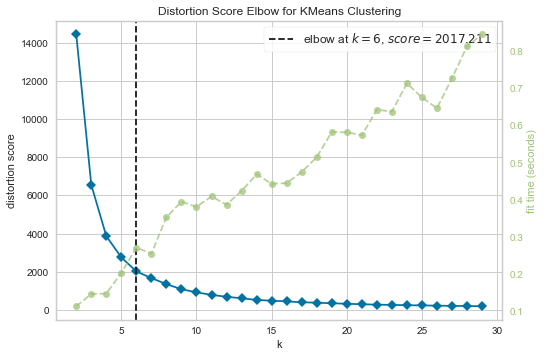

<AxesSubplot:title={'center':'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [33]:
# Elbow Method for K means
model = KMeans()
# k is range of number of clusters.
visualizer = KElbowVisualizer(model, k=(2,30), timings= True)
visualizer.fit(stock_pca2)        # Fit data to visualizer
visualizer.show()        # Finalize and render figure

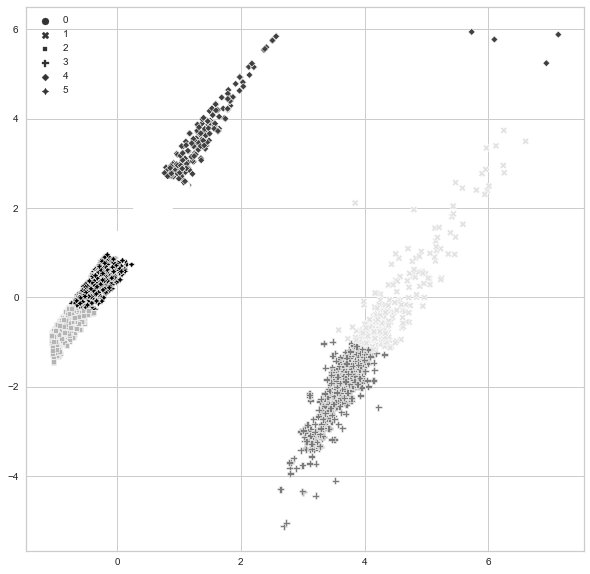

In [37]:
pca_kmeans_cluster = KMeans(n_clusters=6)
clusters2 = pca_kmeans_cluster.fit_predict(stock_pca2)

plt.figure(figsize=(10, 10))

sns.scatterplot(x=stock_pca2[:, 0], y=stock_pca2[:, 1], c=clusters, style=clusters)

plt.show()

Very similar clustering on new data with the same elbow score of k=6

In [38]:
it = pd.DataFrame(scaler.inverse_transform(pca.inverse_transform(stock_pca2)), columns=clean_transactions2.columns)
it['cluster'] = clusters2
aggregate = it.groupby('cluster').mean()
aggregate

,Quantity,UnitPrice,Australia,Austria,Bahrain,Belgium,Brazil,Canada,Channel Islands,Cyprus,...,Saudi Arabia,Singapore,Spain,Sweden,Switzerland,USA,United Arab Emirates,United Kingdom,Unspecified,Payment
cluster,,,,,,,,,,,,,,,,,,,,,
0,9.789804,2.562550,0.000237,-0.000106,-1.218828e-18,0.000178,0.000040,0.000122,-0.000139,-0.000326,...,0.0,0.000115,-0.001076,0.000254,0.000458,0.000063,0.000025,1.001916,-0.000296,19.200328
1,19.344064,2.534461,0.019927,0.008841,2.540721e-18,0.061715,0.001381,0.000979,0.017400,0.009382,...,0.0,0.002440,0.052608,0.008531,0.031629,0.001949,0.002080,0.017314,0.004911,38.673219
2,33.520824,1.154382,0.004711,-0.000688,-1.229864e-17,0.002452,0.001005,0.001501,-0.000834,-0.005796,...,0.0,0.002013,-0.018038,0.005070,0.010910,0.000628,0.000316,0.974435,-0.004327,57.149633
3,2.808166,2.982482,-0.000892,0.000162,2.127049e-18,0.000145,-0.000234,-0.000281,0.000252,0.001408,...,0.0,-0.000427,0.004549,-0.001097,-0.002335,-0.000085,-0.000040,0.999791,0.000961,8.079674
4,7.190500,3.273402,0.018225,0.009442,8.486133e-18,0.062549,0.000918,0.000283,0.018343,0.012576,...,0.0,0.001520,0.063290,0.006273,0.027165,0.001714,0.001995,-0.000709,0.007201,19.376205
5,18.224604,2.060294,0.001769,-0.000343,-5.183597e-18,0.000790,0.000380,0.000611,-0.000444,-0.002309,...,0.0,0.000785,-0.007301,0.001945,0.004085,0.000259,0.000122,0.995302,-0.001751,32.675194


In [39]:
it.cluster.value_counts()/it.cluster.value_counts().sum()

3    0.401176
0    0.333370
5    0.130174
4    0.068028
2    0.035068
1    0.032183
Name: cluster, dtype: float64

In [40]:
aggregate2 = it.groupby('cluster').sum()
aggregate2['Payment']/aggregate2['Payment'].sum()

cluster
0    0.346692
1    0.067413
2    0.108552
3    0.175565
4    0.071395
5    0.230384
Name: Payment, dtype: float64

Division between classes is focused on spending amounts, quantities and total purchase value. After new analysis with KMeans clustering with n=6, the customer divisions are still present based on spending habits, but are more stratified. 